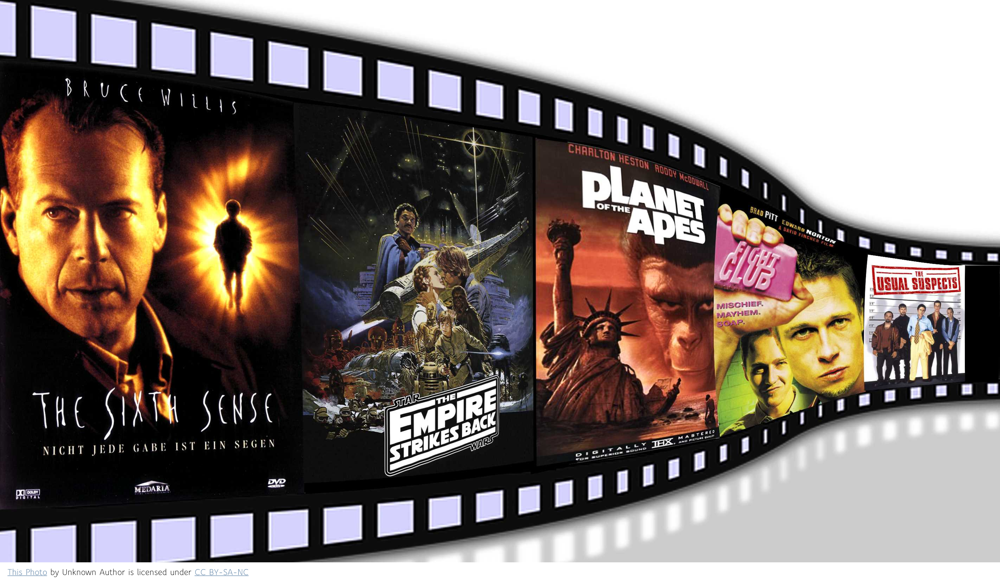

In [ ]:
## Phase 1 Project - Microsoft Movie Analysis 
________________________________________________________________________________________________________________________________

#**Author:**Carla Kirby***

##Overview
The data contained in this analysis has been sourced from IMDb's website. IMDb is a credible movie streaming service which obtains extreme amounts of metadata. From the zipped CSV data files I have chosen to select (2) datasets containing critical details necessary to complete an accurate analysis in efforts to solve the business problem. The information contained relates directly to genres, total domestic gross at time of release and spans across an 8 year period. 




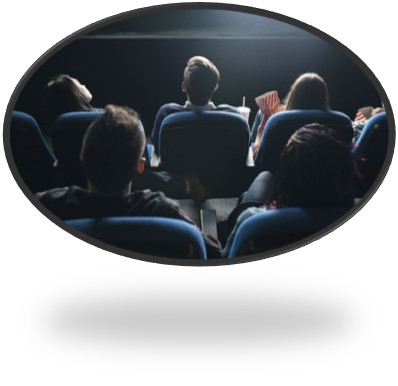

##Business Problem
Microsoft Movie Studios requires critical intel on the types of films frequent movie goers pay to see in the box office. The information specified in this presentation provides clarity on the genres doing the best financially at the box office. The head of Microsoft intends to utilise this data to drive the newly created studio in the right direction and make some all important decisions about what types of movies will be successful with the audience.

##Data Understanding
A few of the variables included are movie titles, year of release, domestic gross totals, foreign gross totals, run time minutes, ID's, and the studio who produced the films. The target variable I have chosen is domestic gross value and genre. It is necessary to advise the head of Microsoft Studios the highest box office gross values in conjunction with the associated types of films to clearly indicate what the national favourites are. There are other factors of interest that may incite further research, such as the studio that produced the film. It will be incredible intel that will fuel further research and will encourage Microsoft Studio's initiation Project Phase headed in the right direction. My recommendation is that they focus on creating Action, Adventure or Sci-Fi films. These feature films are grossing the highest at at the moment and clerly favoured by the viewers. 

In [22]:
# Import standard packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [23]:
#imdb.title.basics
df = pd.read_csv('data\\data_file_1.csv') 

In [24]:
#bom.movie_gross
df1 = pd.read_csv('data\\data_file_2.csv')

In [25]:
#combined two datasets into one table 
dfmerged = pd.merge(df, df1, left_on ="title", right_on="primary_title", how="left", suffixes=[" ","_xyz"])

In [5]:
#understand more of the unique values in the dataset
dfmerged.nunique()

title              3386
studio              257
domestic_gross     1797
foreign_gross      1204
year                  9
tconst             3365
primary_title      2605
original_title     2768
start_year           11
runtime_minutes     161
genres              331
dtype: int64

In [26]:
# mean of the dataset
dfmerged['domestic_gross'].mean

<bound method NDFrame._add_numeric_operations.<locals>.mean of 0       415000000.0
1       334200000.0
2       296000000.0
3       292600000.0
4       238700000.0
           ...     
4143         6200.0
4144         4800.0
4145         2500.0
4146         2400.0
4147         1700.0
Name: domestic_gross, Length: 4148, dtype: float64>

## Data Preparation

Describe and justify the process for preparing the data for analysis.


The variables I chose to drop in preparation of this analysis wer run time minutes, repeated titles and id columns. 
I removed the NaN value rows and the outliers identfied were loated in foreign data.
The way that the data has been structured is apppropriate to teh busine case - as genre was the main topic and supportive information sourced such as domestic gross and which studio created the film is most advantageous.
***

In [27]:
# Understand what columns are present
dfmerged.columns

Index(['title', 'studio', 'domestic_gross', 'foreign_gross', 'year', 'tconst',
       'primary_title', 'original_title', 'start_year', 'runtime_minutes',
       'genres'],
      dtype='object')

In [28]:
#drop unnecssary columns 
dfmerged.drop(['tconst', 'original_title', 'primary_title', 'start_year', 'runtime_minutes'], axis=1, inplace=True)

In [29]:
#drop duplicated values 
dfmerged.drop_duplicates(inplace=True)

In [30]:
#Are there null values? 
dfmerged.isnull().sum()

title                0
studio               5
domestic_gross      34
foreign_gross     1598
year                 0
genres             818
dtype: int64

In [31]:
#remove null value rows 
dfmerged.dropna(axis=0, how='any', thresh=None, subset=None, inplace=True)

In [33]:
#determine what the 'Top Ten' values are 
dfmerged.groupby('title')['domestic_gross'].nlargest(10) 

0       415000000.0
3       292600000.0
4       238700000.0
5       300500000.0
6       312400000.0
           ...     
4000       491000.0
4004         1400.0
4016       725000.0
4049        10000.0
4105        43200.0
Name: domestic_gross, Length: 1934, dtype: float64

In [34]:
#verify that null values have been cleared
dfmerged.isnull().sum()

title             0
studio            0
domestic_gross    0
foreign_gross     0
year              0
genres            0
dtype: int64

In [35]:
#check the genres total and types
dfmerged['genres'].value_counts()

Drama                         140
Documentary                    75
Comedy,Drama                   74
Adventure,Animation,Comedy     72
Comedy,Drama,Romance           71
                             ... 
Animation,Drama,Family          1
Comedy,Horror,Romance           1
Adventure,Drama,Sport           1
Action,Horror,Mystery           1
Adventure,Fantasy,Horror        1
Name: genres, Length: 273, dtype: int64

In [36]:
dfmerged.nlargest(n=10, columns=['domestic_gross'])

,title,studio,domestic_gross,foreign_gross,year,genres
3769,Black Panther,BV,700100000.0,646900000,2018,"Action,Adventure,Sci-Fi"
3768,Avengers: Infinity War,BV,678800000.0,"1,369.50",2018,"Action,Adventure,Sci-Fi"
2264,Jurassic World,Uni.,652300000.0,"1,019.40",2015,"Action,Adventure,Sci-Fi"
3352,Star Wars: The Last Jedi,BV,620200000.0,712400000,2017,"Action,Adventure,Fantasy"
3771,Incredibles 2,BV,608600000.0,634200000,2018,"Action,Adventure,Animation"
2829,Rogue One: A Star Wars Story,BV,532200000.0,523900000,2016,"Action,Adventure,Sci-Fi"
2830,Finding Dory,BV,486300000.0,542300000,2016,"Adventure,Animation,Comedy"
2266,Avengers: Age of Ultron,BV,459000000.0,946400000,2015,"Action,Adventure,Sci-Fi"
885,The Dark Knight Rises,WB,448100000.0,636800000,2012,"Action,Thriller"
1376,The Hunger Games: Catching Fire,LGF,424700000.0,440300000,2013,"Action,Adventure,Sci-Fi"


Hmmm, this is interesting.. although there are many more dramas and documentaries listed, the highest grossing domestic amounts are Adventure, Action and Sci-Fi films. 

Interesting....

In addition, BV - Marvel Studios aka Walt Disney aka Buena Vista Studios definately know how to create box office hits. Microsoft should conduct research into BV's success method. 

## Data Modeling

I chose to plot the data using histograpm, line graphs and plots. 
Iterations explored consisted of a variety of name spaces and different orientations, however I felt that the method visualised below is clear and coincides with the data frame output. 
These choices are appropriate as the information should be simple, succint, and exact. 


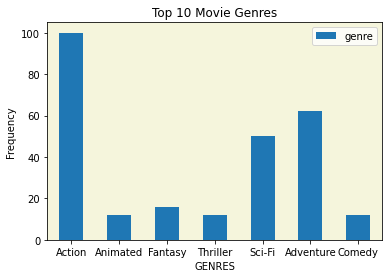

In [38]:
#Histogram showing incremental bar values genres
frequency = [10, 20, 30, 40, 50, 60, 70],
genre = [100, 12, 16, 12, 50, 62, 12]
index = ['Action', 'Animated', 'Fantasy',
         'Thriller', 'Sci-Fi', 'Adventure', 'Comedy']
df = pd.DataFrame({'frequency': frequency,
                   'genre': genre}, index=index)
ax = df.plot.bar(rot=0)
plt.xlabel('GENRES')
plt.ylabel('Frequency ')
plt.title('Top 10 Movie Genres')
ax.set_facecolor("beige")

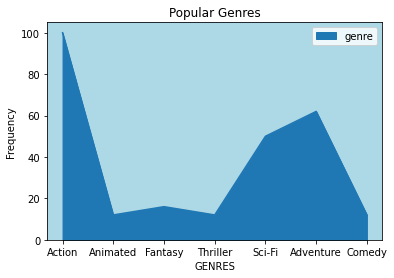

In [39]:
#diagram plotting genres 
dfmerged = pd.DataFrame({
    'domesticgross': [3, 2, 3, 9, 10, 6],
    'foreigngross': [5, 5, 6, 12, 14, 13],
}, index=pd.date_range(start='2012/01/01', end='2018/07/01',
                       freq='Y'))
ax = df.plot.area()
plt.xlabel('GENRES')
plt.ylabel('Frequency ')
plt.title('Popular Genres')
ax.set_facecolor("lightblue")

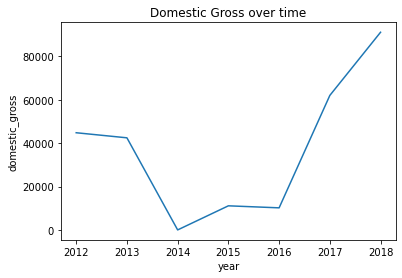

In [40]:
year = [2012,2013,2014,2015,2016,2017,2018]
domestic_gross = [44810.0,42470.0,0.0,11113.0,10180.5,62020.0,91152.0]
  
plt.plot(year, domestic_gross)
plt.title('Domestic Gross over time')
plt.xlabel('year')
plt.ylabel('domestic_gross')
plt.show()

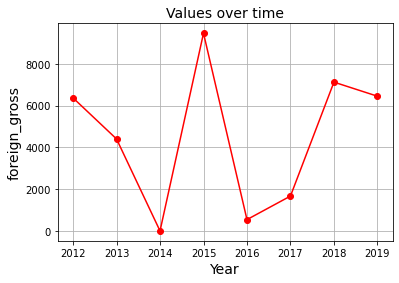

In [41]:
  
Data = {'Year': [2012,2013,2014,2015,2016,2017,2018,2019],
        'foreign_gross': [6368.0,4403.0,0,9465.0,542.3,1669.0,7124.0,6450.0]
       }
  
df = pd.DataFrame(Data,columns=['Year','foreign_gross'])
  
plt.plot(df['Year'], df['foreign_gross'], color='red', marker='o')
plt.title('Values over time', fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.ylabel('foreign_gross', fontsize=14)
plt.grid(True)
plt.show()

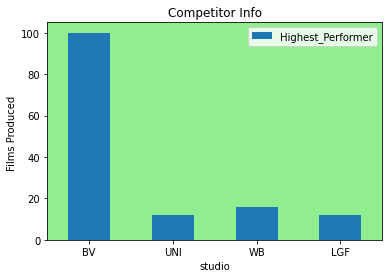

In [42]:
#Diagram listing highest performing studio
studio = [10, 20, 30, 40],
Highest_Performer = [100, 12, 16, 12]
index = ['BV', 'UNI', 'WB','LGF']
df = pd.DataFrame({'Highest_Performer': Highest_Performer,
                   'STUDIO': studio}, index=index)
ax = df.plot.bar(rot=0)
plt.xlabel('studio')
plt.ylabel('Films Produced ')
plt.title('Competitor Info')
ax.set_facecolor("lightgreen")

#Evaluation

My interpretation of the results is that Marvel studios have consistently produced high domesticlly grossing films. 
They genres that are leading in the market right now are Action, Adventure and Sci-Fi films.  
The model is succint, simple and flows. Better than previous visualisation that failed to incorporate details of relevance.
I am confident that these findings are correct and that Microsoft will be able to draw the same conclusions after reviewing the information listed here. 
This model will benefit Microsoft as it will fuel additional research into what is the best approach hto building a strong Film studio and the quality of movies produced, that they cater to the public and will gross the company millions upon release. 


In summary, the data suggests that action and adventure genres are the most loved films that avid movie goers prfer to watch at the box office.
The histogram clearly displays the values for the variety of genres. This model will benefit Microsoft, although more research will be necessary to determine what other success factors go into making a phenomenal movie. 


In addition, we identified that there were many more dramas and documentaries listed when we conducted analysis for the genres types and totals. We can clearly see that the most frequently viewed movies that grossed higher domestic amounts are Adventure and Action films. 

In [ ]:
## Conclusions


After analyzing the dataset, I have arrived at the conclusion that the types of films that do the best in the box office domestically are Action, Adventure, and Sci-Fi films. 
I highly recommend that Microsoft do some further research on the Buena Vista methods of producing as they provide high grossing box office films. 
